In [7]:
import scanpy as sc
import omicverse as ov
ov.plot_set()

Dependency error: (pydeseq2 0.4.11 (/mnt/home/zehuazeng/software/rsc/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [8]:
adata_sp_gas=sc.read('data/GC_ST/GAS_ST_anno.h5ad',compression='gzip')
adata_sp_gc=sc.read('data/GC_ST/GC_ST_anno.h5ad',compression='gzip')

In [9]:
adata_sp_gas.obs.to_csv('data/GC_ST/GAS_ST_anno_obs.csv')
adata_sp_gc.obs.to_csv('data/GC_ST/GC_ST_anno_obs.csv')

In [10]:
adata_sp_gas.raw=adata_sp_gas
adata_sp_gas=adata_sp_gas[:,adata_sp_gas.var.highly_variable_features]

adata_sp_gc.raw=adata_sp_gc
adata_sp_gc=adata_sp_gc[:,adata_sp_gc.var.highly_variable_features]

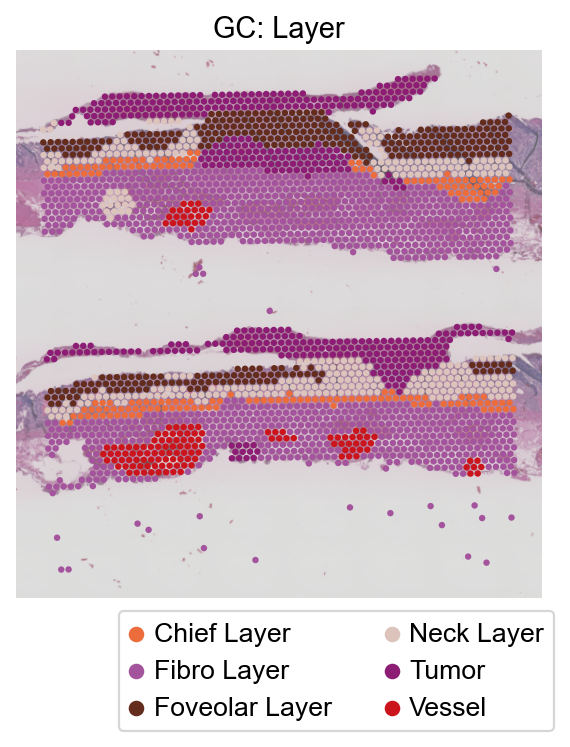

In [11]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4.5,4.5))
axes=sc.pl.spatial(adata_sp_gc, color=['Layer'],
              frameon=False,show=False,ax=ax,
             alpha_img=0.7,size=1.25,#legend_loc='on data'
             )
axes[0].legend(bbox_to_anchor=(1.05,0),ncols=2,fontsize=12)
axes[0].set_title('GC: Layer',fontsize=13)
fig.savefig('figures/st/spatail-layer-gc-44.png',dpi=300,bbox_inches='tight')

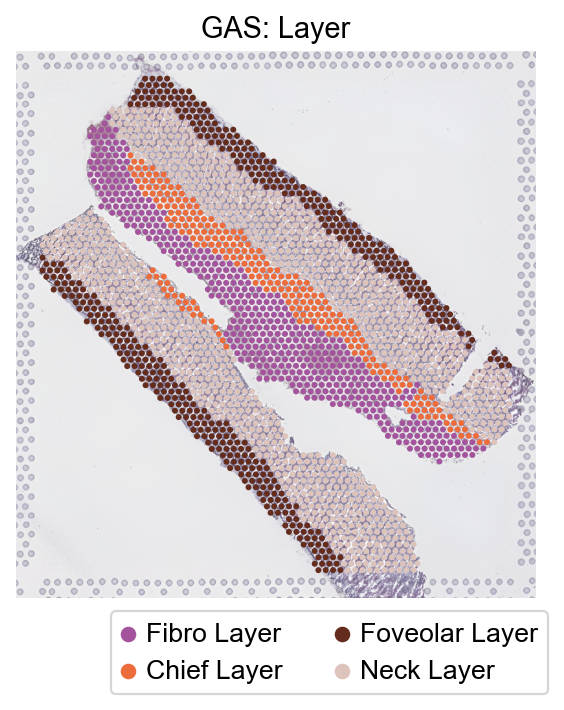

In [12]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4.5,4.5))
axes=sc.pl.spatial(adata_sp_gas, color=['Layer'],
              frameon=False,show=False,ax=ax,
             alpha_img=0.7,size=1.25,#legend_loc='on data'
             )
axes[0].legend(bbox_to_anchor=(1.05,0),ncols=2,fontsize=12)
axes[0].set_title('GAS: Layer',fontsize=13)
fig.savefig('figures/st/spatail-layer-gas-44.png',dpi=300,bbox_inches='tight')

In [13]:
adata_all=sc.read('data/GC_RNA/GC_ANNO.h5ad',compression='gzip')
adata_all

AnnData object with n_obs × n_vars = 148350 × 3000
    obs: 'patient', 'CancerType', 'CancerStage', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'n_genes', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', '_scvi_batch', '_scvi_labels', 'leiden', 'celltype_gbi', 'celltype_gpt', 'best_clusters', 'gpt_celltype_0', 'gpt_celltype_1', 'gpt_celltype_2', 'gpt_celltype_3', 'gpt_celltype_4', 'best_celltype', 'Major_celltype', 'Minor_celltype', 'C_scANVI', 'cell_type_from_scMulan', 'cell_type_from_mulan_smoothing', 'smoothing_score', 'cell_abbreviations', 'log2umi', 'log2counts', 'pct_counts_mt'
    var: 'mt', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'CancerStage_colors', 'CancerType_colors', 'Smoothing', 'bench_best_res', 'best_celltype_colors', 'cell_type_from_mulan_smoothing_colors', 

In [14]:
#adata_sc1=adata_sc[(adata_sc.obs['Tissue']=='Para')]
import random
cellidx=random.sample(adata_all.obs.index.tolist(),30000)
adata_sc1=adata_all[cellidx]

In [15]:
tg_gas=ov.space.Tangram(adata_sc1,adata_sp_gas,clusters='best_celltype')
tg_gas.train(mode="cells",num_epochs=500,device="cuda:0")
adata_plot_gas=tg_gas.cell2location()

tangram have been install version: 1.0.4
ranking genes
    finished: added to `.uns['best_celltype_rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
...Calculate The Number of Markers: 986


INFO:root:508 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1092 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.


...Model prepared successfully


INFO:root:Begin training with 508 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.622, KL reg: 0.023
Score: 0.817, KL reg: 0.001
Score: 0.828, KL reg: 0.001
Score: 0.830, KL reg: 0.001
Score: 0.831, KL reg: 0.001


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


...Model train successfully


In [16]:
tg_gc=ov.space.Tangram(adata_sc1,adata_sp_gc,clusters='best_celltype')
tg_gc.train(mode="cells",num_epochs=500,device="cuda:0")
adata_plot_gc=tg_gc.cell2location()

tangram have been install version: 1.0.4
ranking genes
    finished: added to `.uns['best_celltype_rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
...Calculate The Number of Markers: 986


INFO:root:141 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:392 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.


...Model prepared successfully


INFO:root:Begin training with 141 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.503, KL reg: 0.197
Score: 0.840, KL reg: 0.004
Score: 0.855, KL reg: 0.003
Score: 0.857, KL reg: 0.003
Score: 0.857, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


...Model train successfully


In [21]:
adata_plot_gc.write('data/GC_ST/GC_LOC_ANNO.h5ad')
adata_plot_gas.write('data/GC_ST/GAS_LOC_ANNO.h5ad')

In [17]:
adata_plot_gas.obs.columns

Index(['in_tissue', 'array_row', 'array_col', 'mclust', 'Layer',
       'uniform_density', 'rna_count_based_density', 'T CD8+', 'B cell',
       'Enteroendocrine cell', 'Plasma cell', 'Tuft cell', 'Enterocyte',
       'Mast cell', 'Pericyte', 'Myeloid', 'Endothelial cell', 'Fibroblast',
       'Gastric foveolar cell', 'Gastric Chief cell', 'T CD4+',
       'Pyloric gland cell'],
      dtype='object')

In [ ]:
clust_labels = ['B cell','Plasma cell','T CD4+','T CD8+','Myeloid','Mast cell']

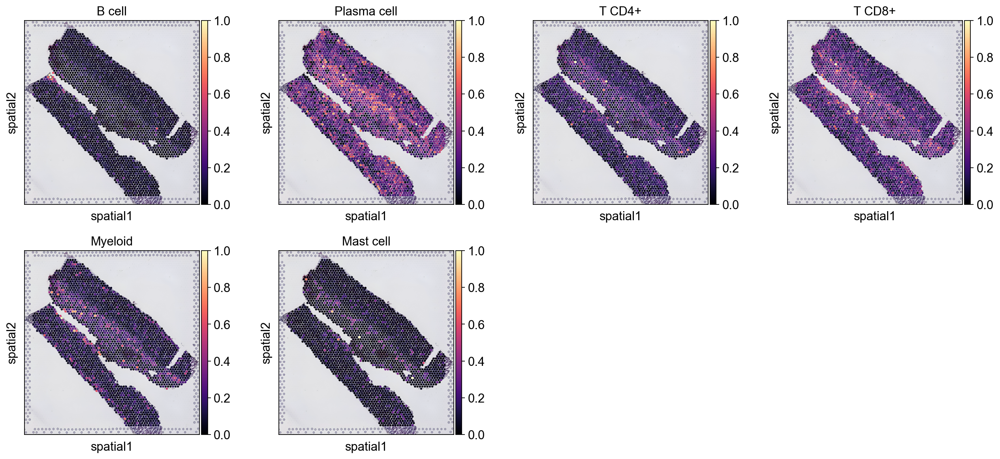

In [18]:
sc.pl.spatial(adata_plot_gas, cmap='magma',
                  # show first 8 cell types
                  color=clust_labels,
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  #vmin=0, vmax='p99.2'
                 )

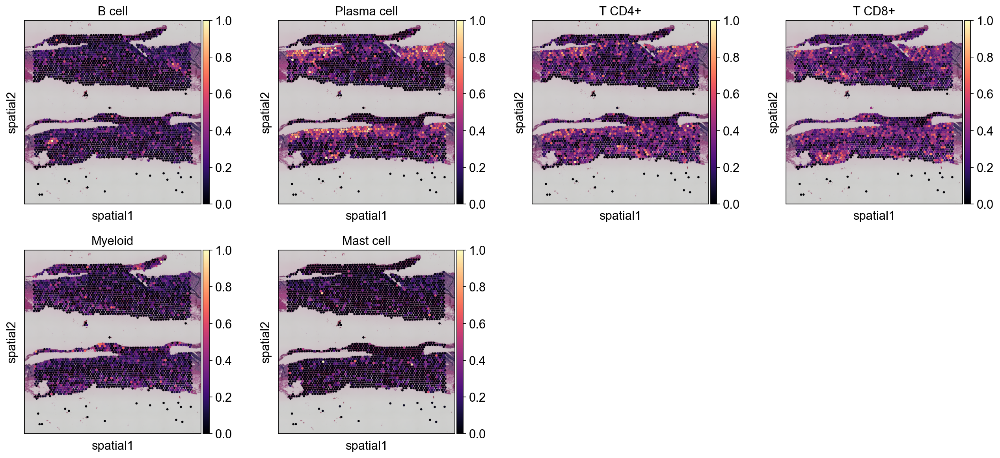

In [19]:
sc.pl.spatial(adata_plot_gc, cmap='magma',
                  # show first 8 cell types
                  color=clust_labels,
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  #vmin=0, vmax='p99.2'
                 )

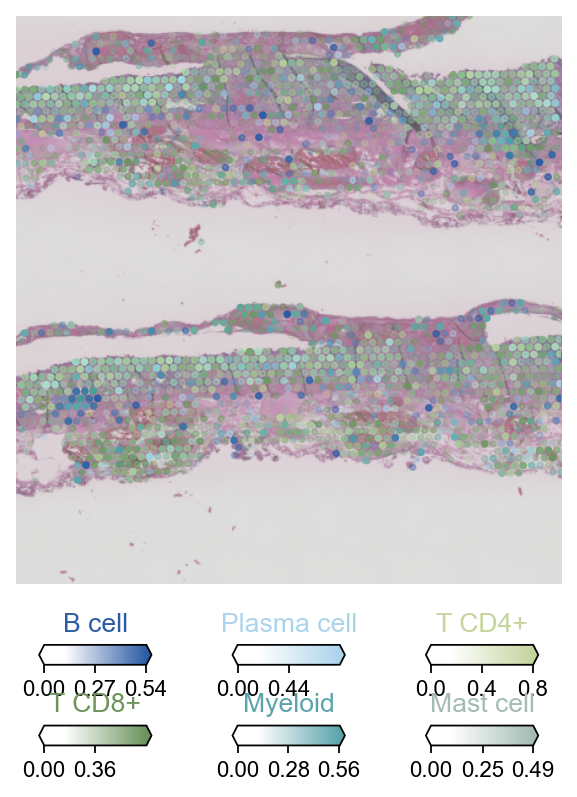

In [20]:
import matplotlib as mpl
import matplotlib.pyplot as plt
clust_labels = ['B cell','Plasma cell','T CD4+','T CD8+','Myeloid','Mast cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gc,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=2.5,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gc.obsm["spatial"] * list(adata_plot_gc.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-immunect-gc-86.png',dpi=300,bbox_inches='tight')

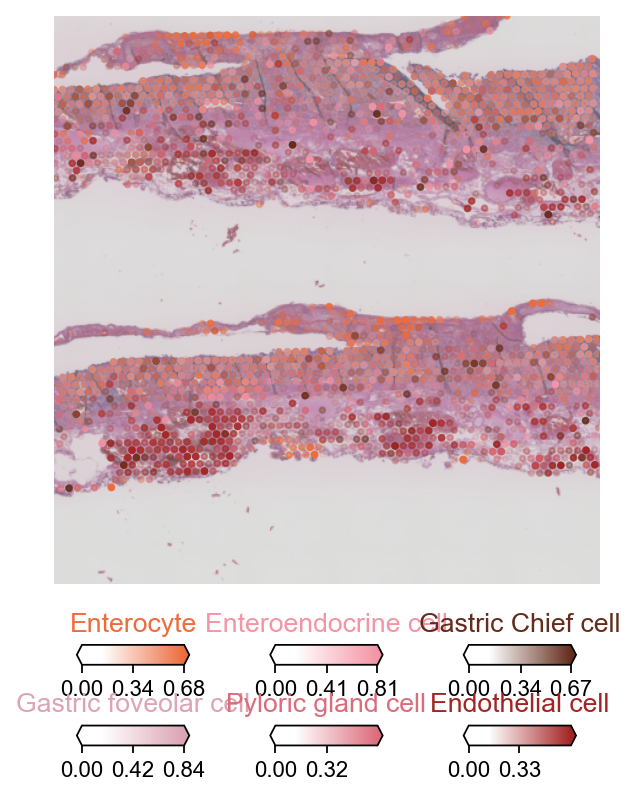

In [22]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
clust_labels = ['Enterocyte','Enteroendocrine cell','Gastric Chief cell',
               'Gastric foveolar cell','Pyloric gland cell','Endothelial cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gc,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=2.5,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gc.obsm["spatial"] * list(adata_plot_gc.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-epi-gc-86.png',dpi=300,bbox_inches='tight')

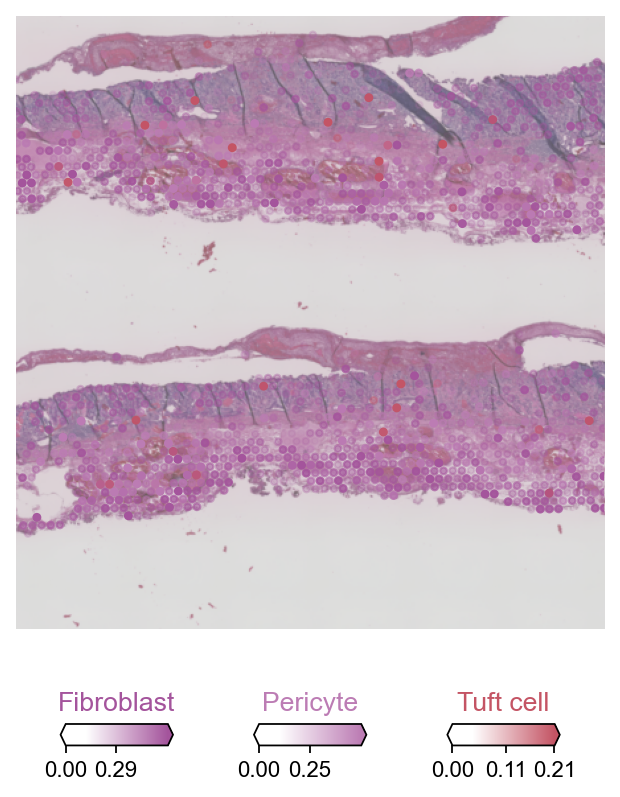

In [23]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
clust_labels = ['Fibroblast','Pericyte','Tuft cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gc,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=3,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gc.obsm["spatial"] * list(adata_plot_gc.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-fibro-gc-86.png',dpi=300,bbox_inches='tight')

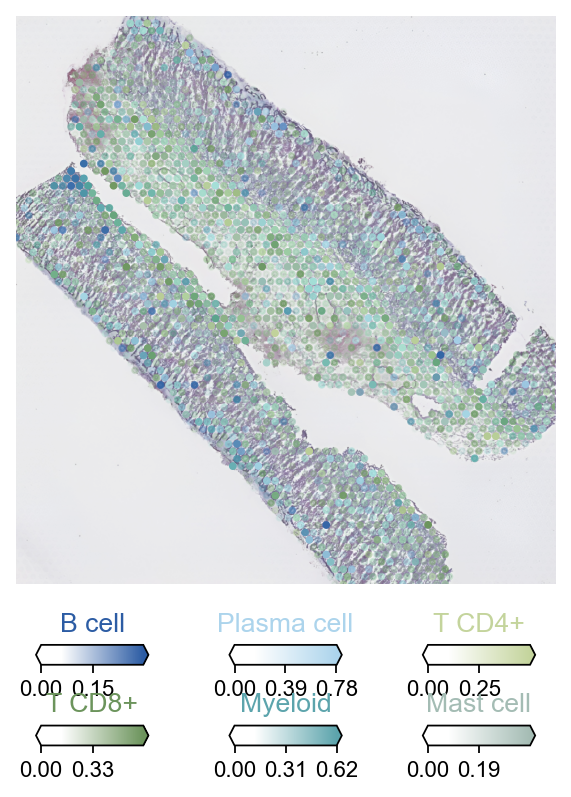

In [24]:
import matplotlib as mpl
import matplotlib.pyplot as plt
clust_labels = ['B cell','Plasma cell','T CD4+','T CD8+','Myeloid','Mast cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gas,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=2.5,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gas.obsm["spatial"] * list(adata_plot_gas.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-immunect-gas-86.png',dpi=300,bbox_inches='tight')

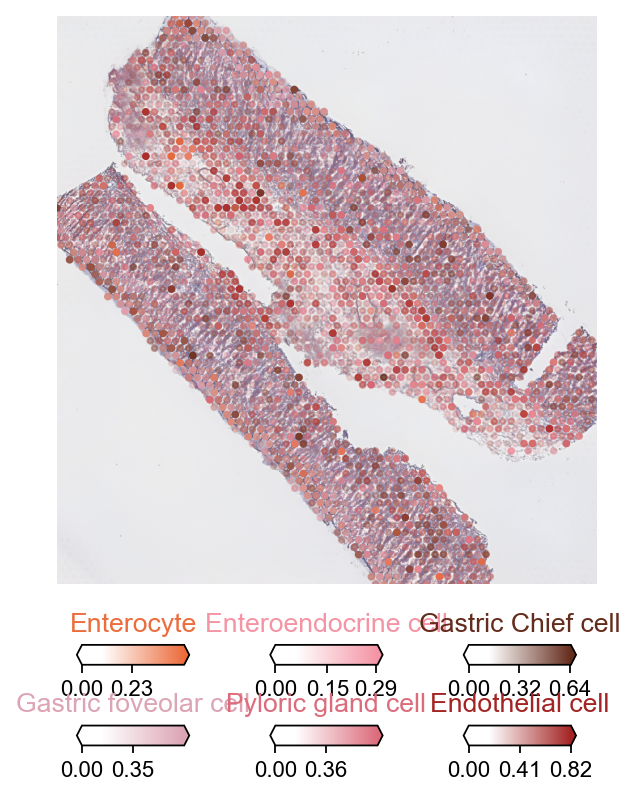

In [25]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
clust_labels = ['Enterocyte','Enteroendocrine cell','Gastric Chief cell',
               'Gastric foveolar cell','Pyloric gland cell','Endothelial cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gas,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=2.5,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gas.obsm["spatial"] * list(adata_plot_gas.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-epi-gas-86.png',dpi=300,bbox_inches='tight')

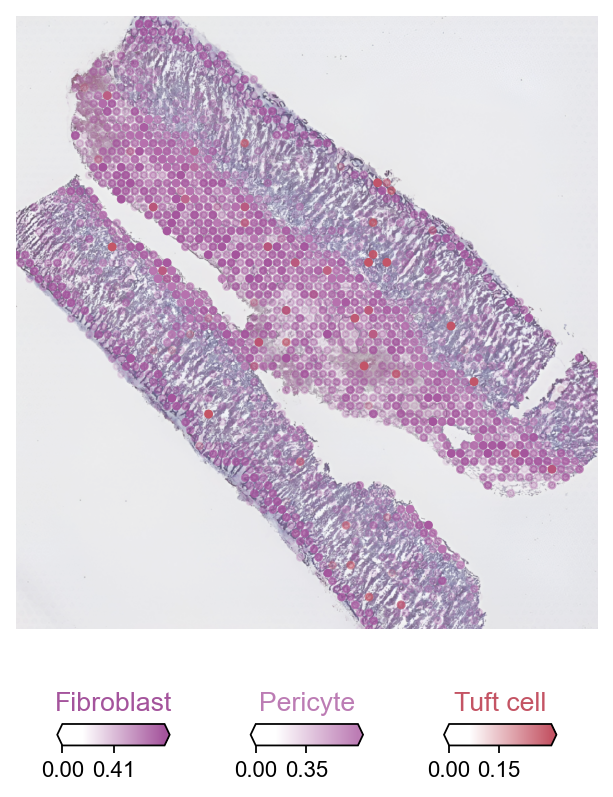

In [26]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
clust_labels = ['Fibroblast','Pericyte','Tuft cell']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels
color_dict=dict(zip(adata_sc1.obs['best_celltype'].cat.categories,
                   adata_sc1.uns['best_celltype_colors']))
with mpl.rc_context({'figure.figsize': (8, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=adata_plot_gas,
        img_key='hires',
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        circle_diameter=3,
        img_alpha=0.7,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        #reorder_cmap = [#0,
        #    1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        #colorbar_position='right',
        palette=color_dict,
        colorbar_tick_size=10,
        legend_title_fontsize=12,
        colorbar_position='bottom',
        
        #coords=
        #crop_coord=[7000, 10000, 0, 6000],
    )
    co=adata_plot_gas.obsm["spatial"] * list(adata_plot_gas.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    fig.axes[0].set_xlim(co[:,0].min(),co[:,0].max())
    fig.axes[0].set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig('figures/st/spatail-fibro-gas-86.png',dpi=300,bbox_inches='tight')

(930.776743936, 466.68251136)

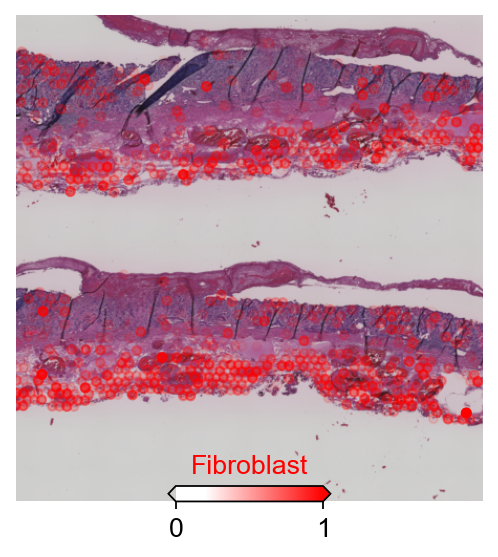

In [135]:
ax=ov.pl.spatial_value(adata_plot_gc,color='Fibroblast',#cmap=cmap_color,
                    library_id='2')
co=adata_plot_gc.obsm["spatial"] * list(adata_plot_gc.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]

ax.set_xlim(co[:,0].max(),co[:,0].min())
ax.set_ylim(co[:,1].max(),co[:,1].min())


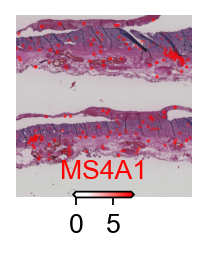

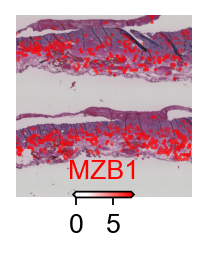

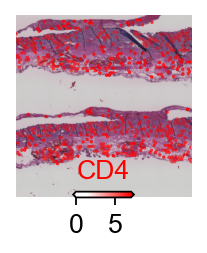

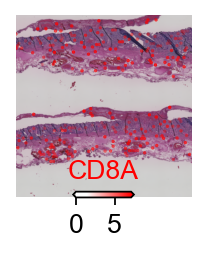

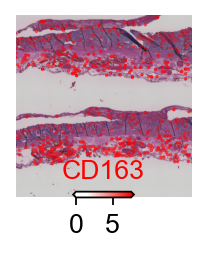

...

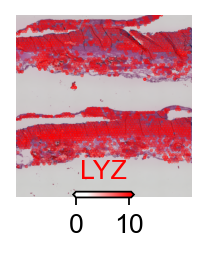

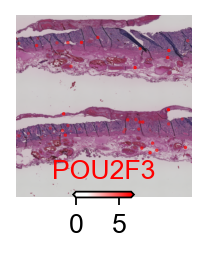

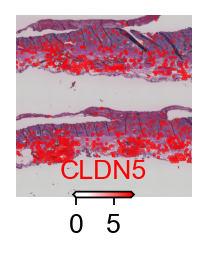

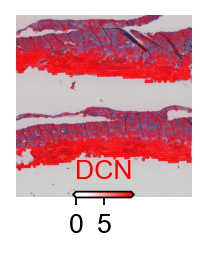

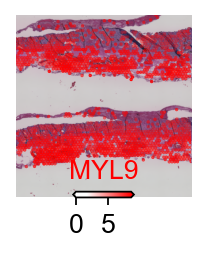

In [27]:
markers ={
    'B cell':['MS4A1','CD74'],
    'Plasma cell':['MZB1','CD38'],
    'T CD4+':['CD4','CD3D','CD3E'],
    'T CD8+':['CD8A','NKG7','CCL5'],
    'Myeloid':['CD163'],
    'Mast cell':['CPA3'],
    
    
    'Enterocyte':['CDH17'],
    'Enteroendocrine cell':['SCG5'],
    'Gastric Chief cell':['LIPF','PGC', ],
    'Gastric foveolar cell':['MUC5AC','TFF1'],
    'Pyloric gland cell':['LYZ', 'PGC',],
    'Tuft cell':['POU2F3'],
    'Endothelial cell':['CLDN5'],
    
    
    'Fibroblast':['DCN',],
    'Pericyte':['MYL9','CSPG4',],

}
adata_sp_gc_raw=adata_sp_gc.raw.to_adata()
for m in markers.keys():
    gene=markers[m][0]
    fig, ax = plt.subplots(figsize=(1.5,1.5))
    ov.pl.spatial_value(adata_sp_gc_raw,color=gene,#cmap=cmap_color,
                    library_id='2',ax=ax,dot_size=0.5)
    co=adata_sp_gc.obsm["spatial"] * list(adata_sp_gc.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    ax.set_xlim(co[:,0].min(),co[:,0].max())
    ax.set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig(f'figures/st_exp/gc-{gene}-{m}-1-5.png',dpi=300,bbox_inches='tight')

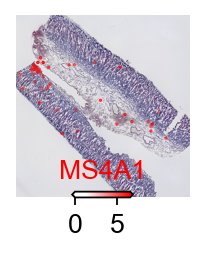

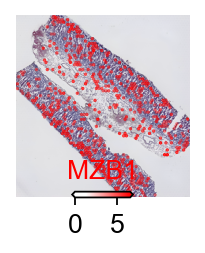

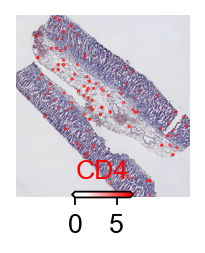

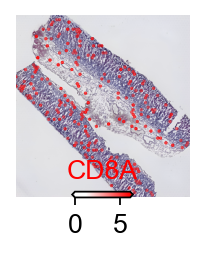

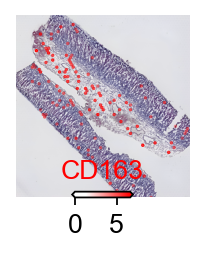

...

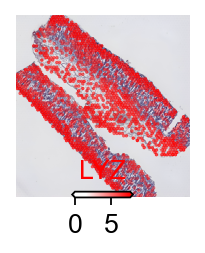

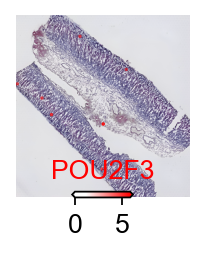

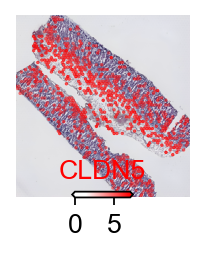

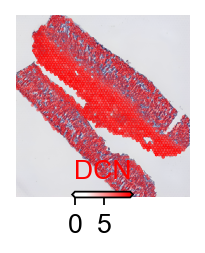

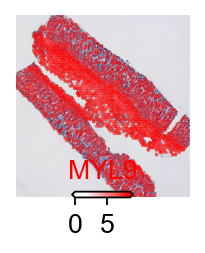

In [28]:
markers ={
    'B cell':['MS4A1','CD74'],
    'Plasma cell':['MZB1','CD38'],
    'T CD4+':['CD4','CD3D','CD3E'],
    'T CD8+':['CD8A','NKG7','CCL5'],
    'Myeloid':['CD163'],
    'Mast cell':['CPA3'],
    
    
    'Enterocyte':['CDH17'],
    'Enteroendocrine cell':['SCG5'],
    'Gastric Chief cell':['LIPF','PGC', ],
    'Gastric foveolar cell':['MUC5AC','TFF1'],
    'Pyloric gland cell':['LYZ', 'PGC',],
    'Tuft cell':['POU2F3'],
    'Endothelial cell':['CLDN5'],
    
    
    'Fibroblast':['DCN',],
    'Pericyte':['MYL9','CSPG4',],

}
adata_sp_gas_raw=adata_sp_gas.raw.to_adata()
for m in markers.keys():
    gene=markers[m][0]
    fig, ax = plt.subplots(figsize=(1.5,1.5))
    ov.pl.spatial_value(adata_sp_gas_raw,color=gene,#cmap=cmap_color,
                    library_id='HRR742264',ax=ax,dot_size=0.5)
    co=adata_sp_gas.obsm["spatial"] * list(adata_sp_gas.uns["spatial"].values())[0]["scalefactors"][f"tissue_hires_scalef"]
    
    ax.set_xlim(co[:,0].min(),co[:,0].max())
    ax.set_ylim(co[:,1].max(),co[:,1].min())
    fig.savefig(f'figures/st_exp/gas-{gene}-{m}-1-5.png',dpi=300,bbox_inches='tight')